In [2]:
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler, StableDiffusionXLImg2ImgPipeline
from diffusers.utils import load_image, make_image_grid
import torch
from PIL import Image

In [ ]:
model_id = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None)
pipe.to("cuda")
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

c:\Users\bryan\.conda\envs\Blending\lib\site-packages\huggingface_hub\file_download.py:140: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\bryan\.cache\huggingface\hub\models--timbrooks--instruct-pix2pix. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Fetching 14 files:  43%|████▎     | 6/14 [01:42<02:23, 17.88s/it]

In [ ]:
pipe = StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipe = pipe.to("cuda")

model_index.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.71k [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/4.52G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

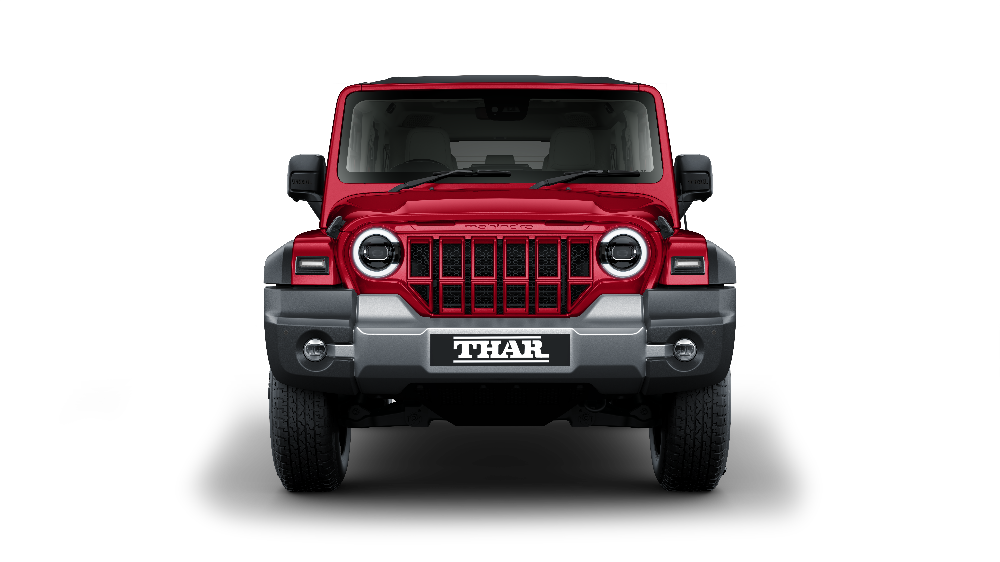

In [ ]:
image = Image.open('img.png')
image

In [ ]:
# image = load_image("https://cdni.autocarindia.com/Utils/ImageResizer.ashx?n=https://cdni.autocarindia.com/Features/Mahindra-Alturas-G4-front-o.jpg&w=700&c=1")
# image

Image width: 512 pixels
Image height: 288 pixels


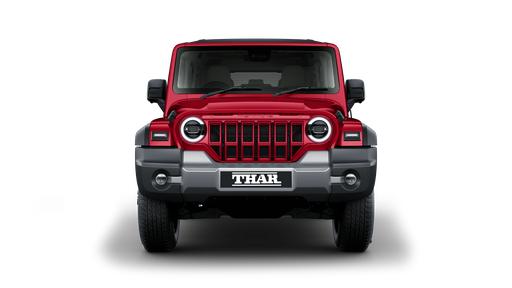

In [ ]:
RESIZE_FACTOR = 15
width, height = image.size
image_rs = image.resize((width//RESIZE_FACTOR, height//RESIZE_FACTOR), Image.Resampling.LANCZOS)
print(f"Image width: {width//RESIZE_FACTOR} pixels")
print(f"Image height: {height//RESIZE_FACTOR} pixels")
image_rs

In [ ]:
# image = image_rs

In [ ]:
prompt = "DO NOT CHANGE ANY DETAILS LIKE SHAPE OR ORIENTATION OF THE CAR, add a background of a mountains and dirt road such that the car is driving on it"
image_mod = pipe(prompt, image=image_rs, num_inference_steps=10, image_guidance_scale=1).images[0]
image_mod

  0%|          | 0/10 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 270.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 181.06 MiB is free. Process 2352 has 14.57 GiB memory in use. Of the allocated memory 14.11 GiB is allocated by PyTorch, and 332.56 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

  0%|          | 0/100 [00:00<?, ?it/s]

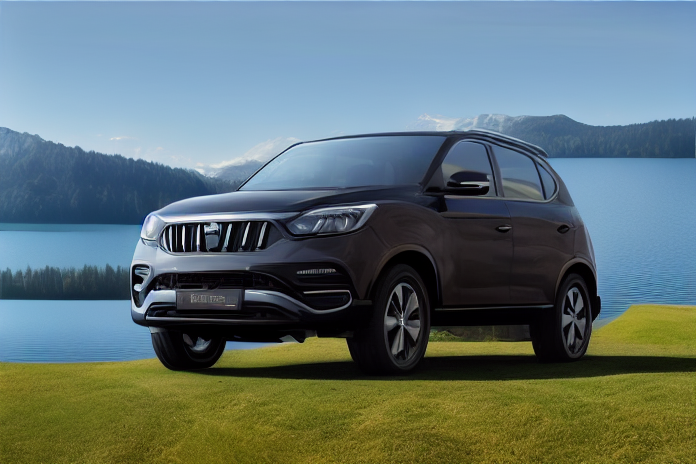

In [ ]:
prompt = "Fix the misalignment of the mountains and lake in the background"
gen_image = pipe(prompt, image=image_mod).images[0]
gen_image